In [2]:
import os
import rf
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
from math import ceil
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.signal import hilbert, correlate
import pygmt


In [44]:
def apply_reverberation_filter(cha_data):
    result_stream = []
    for i, tr in enumerate(cha_data):
        lead_time = tr.stats.onset - tr.stats.starttime

        relative_time = tr.times() - lead_time
        mask = np.array((relative_time < 0) | (relative_time > 5.0))
        loc = np.argmax(np.ma.masked_array(tr.data, mask=mask))
        dt = relative_time[loc]

        data = correlate(tr.data, tr.data, mode='full')
        data /= np.max(data)
        data = data[len(data) // 2:]

        r0 = -(np.min(data))
        Dt = np.argmin(data) * 1. / tr.stats.sampling_rate

        tr_copy = tr.copy()
        resonance_filter = np.zeros(len(tr.data))
        resonance_filter[0] = 1
        resonance_filter[int(Dt * tr.stats.sampling_rate)] = r0
        tr_copy.data = np.convolve(tr_copy.data, resonance_filter, mode='full')
        tr_copy.data = tr_copy.data[:len(tr_copy.data) // 2 + 1]

        #assert tr.data.shape == tr_copy.data.shape, 'Input/output length mismatch detected in ' \
        #                                            'reverberation removal routine'

        # tr_copy.stats.update({'t1_offset':dt,
        #                       't2_offset':Dt - dt,
        #                       't3_offset':Dt,
        #                       'r0_offset':r0})

        result_stream.append(tr_copy)
    # end for

    return rf.RFStream(result_stream)


In [45]:
try:
    dataroot = os.environ["DATADIR"]
except KeyError:
    dataroot = os.path.join("..", "data", "processed")
try:
    run = os.environ['RUN']
except KeyError:
    print("Using latest run")
    run = max(
        [
            os.path.join(dataroot, d)
            for d in os.listdir(dataroot)
            if os.path.isdir(os.path.join(dataroot, d))
        ],
        key=os.path.getmtime,
    )
stacks = rf.read_rf(os.path.join(run, "rfstacks.h5"), format='h5').sort(["delay","network", "station"])
reverb_filter_stacks = apply_reverberation_filter(stacks)

Using latest run


OA.BM31.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BM31.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BN29.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BN29.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BO24.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BO24.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BV23.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BV23.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BV30.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BV30.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BV32.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.BV32.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.CB22.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.CB22.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.CB27.. | -5.0s - 10.0s | 50.0 Hz, 751 samples | (Ps moveout)
OA.CB27.. | -5.0s - 10.0s | 50.0 Hz, 751

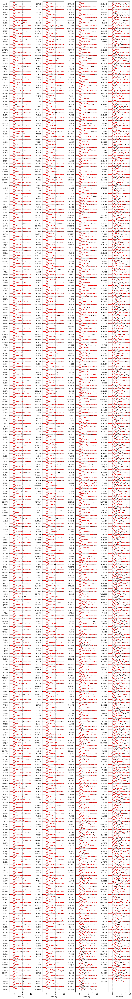

In [46]:
delays = [trace.stats.delay for trace in stacks]
nstacks = len(stacks)
ncols = 4
stacks_per_column = ceil(nstacks / ncols)

stack_height = 0.2
column_height = stack_height * stacks_per_column
fig, axs = plt.subplots(1, ncols, figsize=(10, column_height + 2), tight_layout=True)
for j, ax in enumerate(axs):
    i = 0
    column_stations = []
    while i < stacks_per_column:
        try:
            stack = stacks[j * stacks_per_column + i]
            rv_stack = reverb_filter_stacks[j * stacks_per_column + i]
            assert stack.id == rv_stack.id, f"Stack id {stack.id} does not match that from reverb_filter_stack {rv_stack.id}"
        except IndexError:
            #plot nothing so that what is plotted doesn't get stretched along y
            ax.plot(times, data + i, alpha=0)
            i += 1
            continue
        for _stack , style in zip([stack, rv_stack], ["k", "r"]):
            times = _stack.times() - _stack.stats.onset.second
            print(stack)
            data = _stack.data
            data /= data.max()
            level = stacks_per_column - 1 - i
            ax.plot(times, data + level, style, lw=1)
        column_stations.append(".".join([_stack.meta.network, _stack.meta.station]))
        i += 1
    while i:
        try:
            ax.set_yticks(np.arange(stacks_per_column - 1, stacks_per_column - 1 - i, -1))
            ax.set_yticklabels(column_stations, fontsize="x-small", horizontalalignment="right")
        except ValueError:  # i != len(column_stations) 
            i -= 1
        else:
            break

for ax in axs:
    ax.xaxis.set_minor_locator(MultipleLocator(2.5))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.set_xlim([-2.5, 10])
    ax.set_ylim([-1, stacks_per_column])
    ax.grid(True, ls="--")
    ax.set_xlabel("Time (s)")


In [6]:
delays = []
Dts = []
for tr in reverb_filter_stacks:
    delays.append(tr.stats.delay)
    Dts.append(tr.stats.t3_offset)

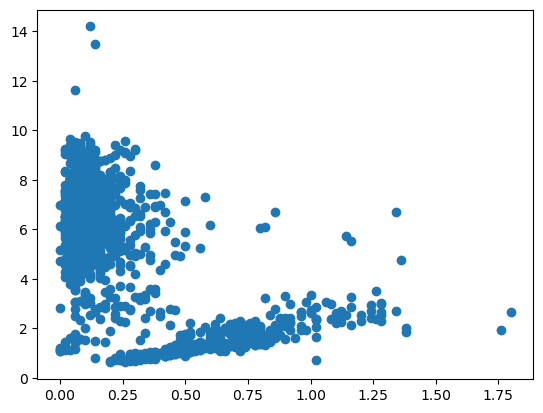

In [7]:
plt.scatter(delays, Dts)

In [8]:
tr = reverb_filter_stacks[1]
tr.stats

          network: OA
          station: BN29
         location: 
          channel: 
        starttime: 1970-01-01T00:00:00.000000Z
          endtime: 1970-01-01T00:00:15.000000Z
    sampling_rate: 50.0
            delta: 0.02
             npts: 751
            calib: 1.0
          _format: H5
            delay: 0.0
          moveout: Ps
            onset: 1970-01-01T00:00:05.000000Z
            phase: P
       processing: ['ObsPy 1.2.0: trim(endtime=UTCDateTime(2020, 8, 12, 17, 28, 44, 800757)::fill_value=None::nearest_sample=True::pad=False::starttime=UTCDateTime(2020, 8, 12, 17, 24, 44, 800757))', 'ObsPy 1.2.0: trim(endtime=UTCDateTime(2020, 8, 12, 17, 28, 34, 800000)::fill_value=None::nearest_sample=True::pad=False::starttime=UTCDateTime(2020, 8, 12, 17, 24, 54, 800000))', "ObsPy 1.2.0: resample(no_filter=True::sampling_rate=50.0::strict_length=False::window='hanning')", "ObsPy 1.2.0: detrend(options={}::type='linear')", "ObsPy 1.2.0: taper(max_length=None::max_percentage=0.05::si

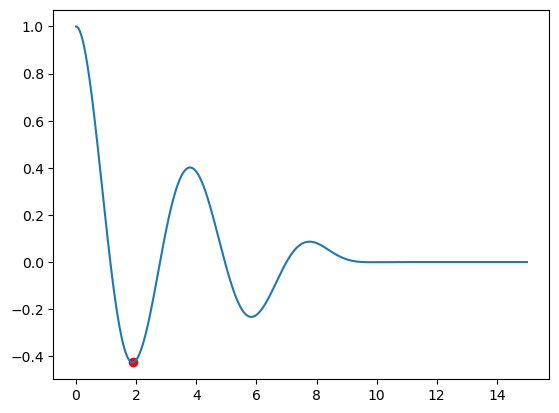

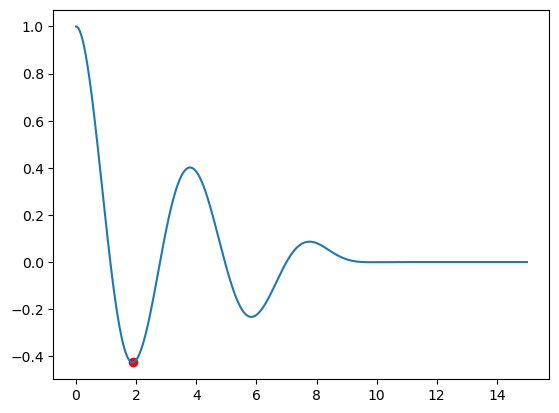

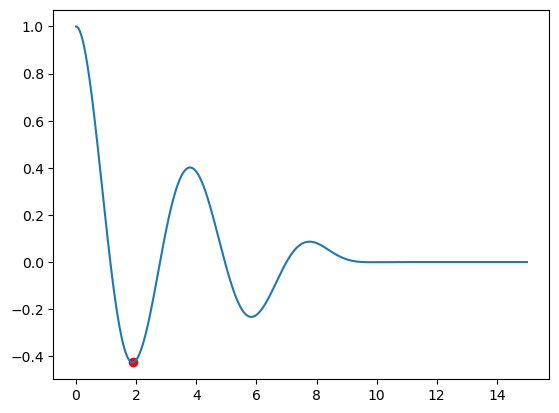

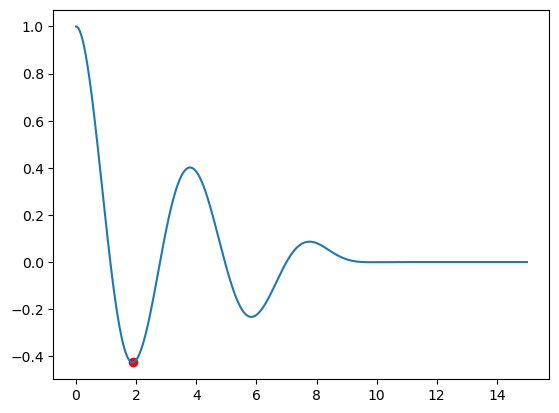

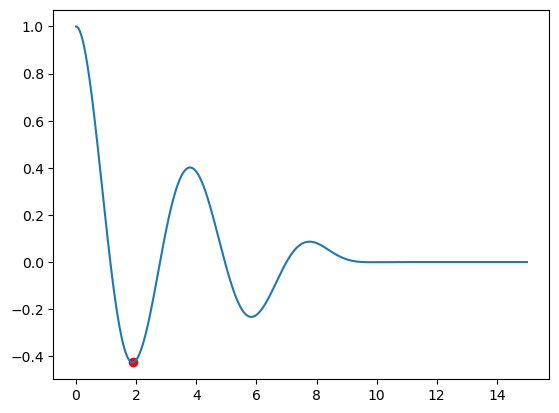

In [9]:
from scipy.signal import hilbert, correlate

for n in range(5):
    for i, tr in enumerate(stacks):
        if tr.stats.network==reverb_filter_stacks[n].stats.network:
            if tr.stats.station==reverb_filter_stacks[n].stats.station:
                lead_time = tr.stats.onset - tr.stats.starttime

            relative_time = tr.times() - lead_time
            mask = np.array((relative_time < 0) | (relative_time > 5.0))
            loc = np.argmax(np.ma.masked_array(tr.data, mask=mask))
            dt = relative_time[loc]

            data = correlate(tr.data, tr.data, mode='full')
            data /= np.max(data)
            data = data[len(data) // 2:]

            r0 = -(np.min(data))
            Dt = np.argmin(data) * 1. / tr.stats.sampling_rate

            tr_copy = tr.copy()
            resonance_filter = np.zeros(len(tr.data))
            resonance_filter[0] = 1
            resonance_filter[int(Dt * tr.stats.sampling_rate)] = r0
            tr_copy.data = np.convolve(tr_copy.data, resonance_filter, mode='full')
            tr_copy.data = tr_copy.data[:len(tr_copy.data) // 2 + 1]

            assert tr.data.shape == tr_copy.data.shape, 'Input/output length mismatch detected in ' \
                                                        'reverberation removal routine'

            tr_copy.stats.update({'t1_offset':dt,
                                't2_offset':Dt - dt,
                                't3_offset':Dt,
                                'r0_offset':r0})
    plt.figure()
    plt.plot(tr.times(),data)
    plt.scatter(*[[Dt],[-r0]],marker='o',color='r')  
    
    
    
    


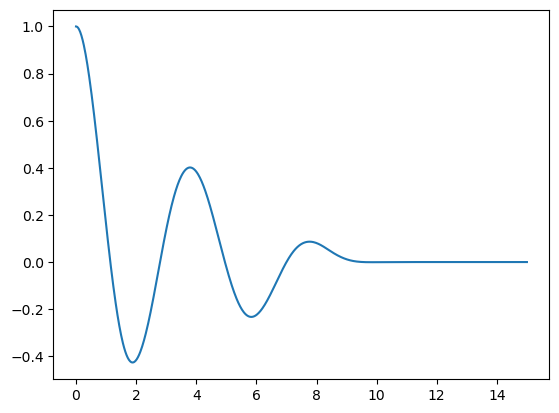

In [10]:
#plt.plot(tr.times(),tr_copy.data)
#plt.plot(tr.times(),resonance_filter)
#plt.plot(tr.times(),tr.data)
plt.plot(tr.times(),data)
#plt.scatter([Dt],[-r0])


In [11]:
def plot_map(stream: rf.RFStream, save_dir=".", show=False):
    region = [112, 155, -46, -8]
    ln_min, ln_max, lt_min, lt_max = region
    projection = (
        f"M{int(np.mean([ln_min, ln_max]))}/{int(np.mean([lt_min, lt_max]))}/15c"
    )

    lats = np.zeros(len(stream), dtype=float)
    lons = np.zeros_like(lats, dtype=float)
    nets = np.zeros_like(lats, dtype=str)
    delays = np.zeros_like(lats, dtype=float)

    for i, trace in enumerate(stream):
        lats[i] = trace.meta.station_latitude
        lons[i] = trace.meta.station_longitude
        nets[i] = trace.meta.network
        delays[i] = trace.stats.t3_offset

    fig = pygmt.Figure()
    fig.basemap(region=region, projection=projection, frame=True)
    fig.coast(
        region=region,
        projection=projection,
        shorelines=1,
        land="#ffffe6",
        water="#e6ffff",
        borders="2/1p,grey",
    )

    pygmt.makecpt(cmap="hot", series=[0, 9, 0.1],background="o", reverse=True)

    fig.plot(
        region=region,
        projection=projection,
        x=lons,
        y=lats,
        style=f"tc",
        fill=delays,
        cmap=True,
        size=np.full_like(lons, 0.25),
    )
    fig.colorbar(
        region=region,
        projection=projection,
        frame=["af+lTwo way travel time (s)", f"y+lmax={delays.max():.2f}"],
        position="JBC+ef",
    )
    if save_dir is not None:
        mapfile = os.path.join(save_dir, "delay_map.pdf")
        fig.savefig(mapfile)
    if show:
        fig.show()

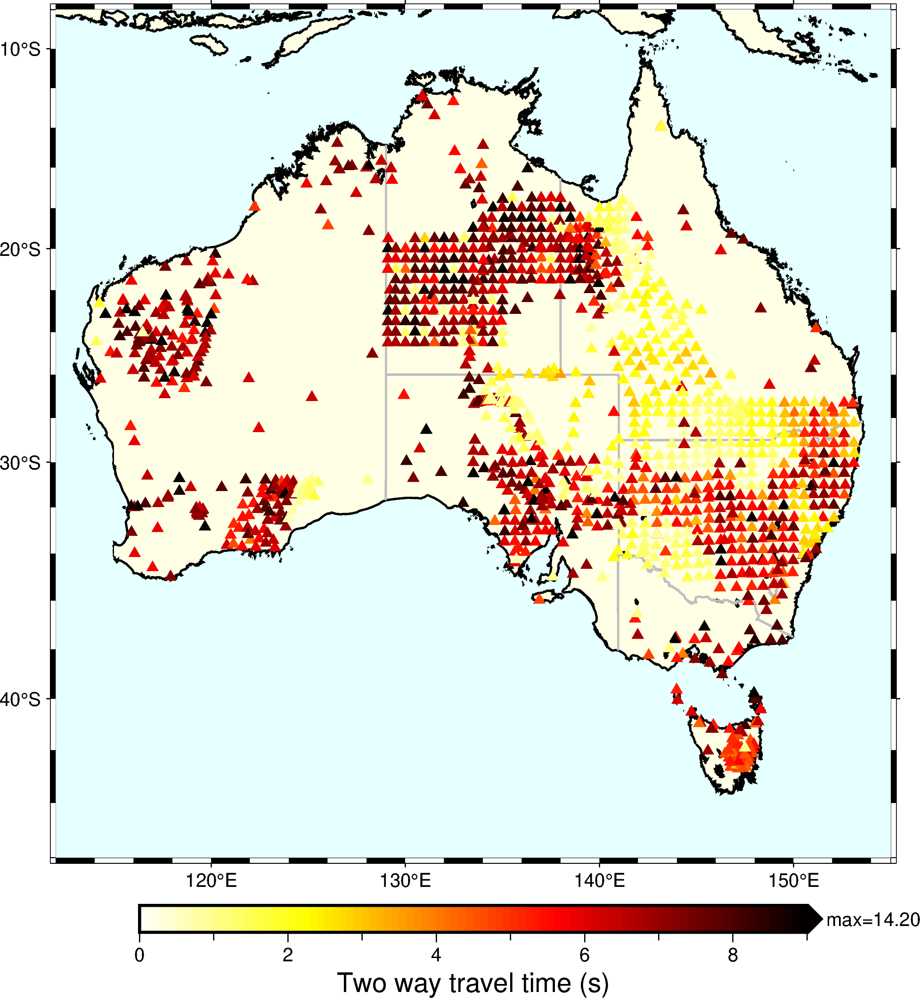

In [12]:
plot_map(reverb_filter_stacks, show=True)

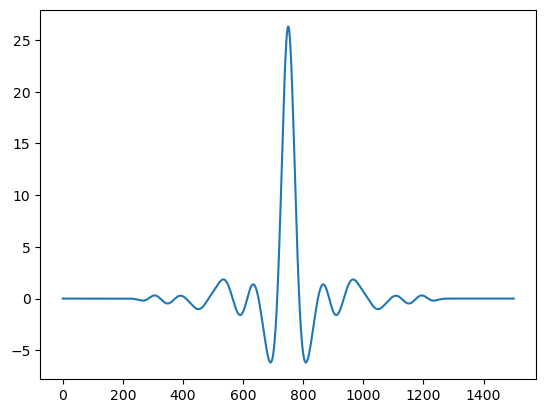

1457


In [59]:
#def apply_reverberation_filter(cha_data):
Autocorrelation = []
for tr in stacks:
    A = correlate(tr.data, tr.data, mode='full')
    Autocorrelation.append(A)
    #return rf.RFStream(Autocorrelation)
N_Auto = len(Autocorrelation)   
print(N_Auto)


In [71]:
auto_length = A.size // 2
start = 0
stop = 15
sampling_rate = 50
times = np.linspace(start, stop, (stop - start) * sampling_rate +1)


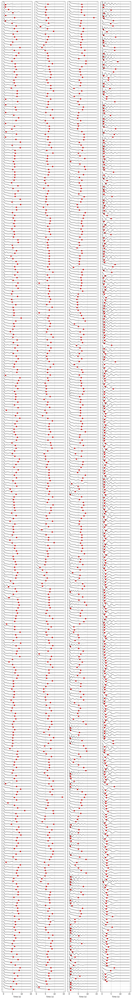

In [72]:
ncols = 4
Autocorrelation_per_column = ceil(N_Auto / ncols)
Autocorrelation_height = 0.2
column_height = Autocorrelation_height * Autocorrelation_per_column
fig, axs = plt.subplots(1, ncols, figsize=(10, column_height + 2), tight_layout=True)

for j, ax in enumerate(axs):
    i = 0
    column_stations = []
    while i < Autocorrelation_per_column:
        try:
            data = Autocorrelation[j * Autocorrelation_per_column + i]
        except IndexError:
            #plot nothing so that what is plotted doesn't get stretched along y
            #ax.plot(times, data + i, alpha=0)
            i += 1
            continue
        
        data /= data.max()
        data = data[data.size // 2:]
        r0 = -(np.min(data))
        Dt = np.argmin(data) * 1. / tr.stats.sampling_rate
        
        level = Autocorrelation_per_column - 1 - i
        ax.plot(times, data + level, color="k", lw=1)
        ax.scatter(*[[Dt],[-r0+level]],marker='o',color='r')
        # column_stations.append(".".join([_stack.meta.network, _stack.meta.station]))
        
        i += 1
    while i:
        try:
            ax.set_yticks(np.arange(Autocorrelation_per_column - 1, Autocorrelation_per_column - 1 - i, -1))
            ax.set_yticklabels(column_stations, fontsize="x-small", horizontalalignment="right")
        except ValueError:  # i != len(column_stations) 
            i -= 1
        else:
            break

for ax in axs:
    ax.set_ylim([-1, Autocorrelation_per_column])
    ax.grid(True, ls="--")
    ax.set_xlabel("Time (s)")

